In [2]:
# Notebooks specific imports
from IPython import get_ipython
ipython = get_ipython()
#Expand notebook display

from IPython.core.display import display, HTML
display(HTML("<style>.container { width:80% !important; }</style>"))
# Display all cell outputs
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = 'all'
# autoreload extension
if 'autoreload' not in ipython.extension_manager.loaded:
    %load_ext autoreload
%autoreload 2
from tqdm import tqdm_notebook

# Basic useful imports
import re
import time
import yaml
from pprint import pprint
from pathlib import Path
import h5py

# Data manipulation
import numpy as np
from scipy.special import erf
from scipy.integrate import quad
import scipy.stats as stats
from scipy.signal import savgol_filter

# Visualization
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib.patches import (Circle, RegularPolygon, FancyArrowPatch, ArrowStyle)
from matplotlib.ticker import (MultipleLocator, FormatStrFormatter,
                               AutoMinorLocator, NullFormatter)
import matplotlib.colors as colors

# From alens_analysis.py
import alens_analysis as aa
from alens_analysis.colormaps import register_cmaps

# Locations
ws_path = Path('/home/alamson/DATA/Chromatin/')
mnt_path = Path.home() / 'projects/DATA/Chromatin/'
ceph_path = Path.home() / 'ceph/DATA/Chromatin/'

/tmp/ipykernel_889952/524104198.py:6: DeprecationWarning: Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display
  from IPython.core.display import display, HTML


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [4]:
graph_sty = {
    "axes.titlesize": 20,
    "axes.labelsize": 24,
    "lines.linewidth": 2,
    "lines.markersize": 2,
    "xtick.labelsize": 24,
    "ytick.labelsize": 24,
    "font.size": 20,
    "font.sans-serif": 'Helvetica',
    "text.usetex": False,
    'mathtext.fontset': 'cm',
}
plt.style.use(graph_sty)

register_cmaps()
#plt.rcParams['image.cmap'] = 'emct8'
#plt.rcParams['image.cmap'] = 'warm'
plt.rcParams['image.cmap'] = 'YlOrRd'
#plt.rcParams['image.cmap'] = 'twilight'
#plt.rcParams['image.cmap'] = 'coolwarm'
#plt.rcParams['image.cmap'] = 'RdYlBu_r'

# Fully collapsed chromatin

In [39]:
data_path = (ws_path /"21-09-27_aLchr1_line700_sticky")
ss_ind = 0
end_ind = -1
start_bead = 0
end_bead = -1
with h5py.File(next(data_path.glob('analysis/*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:end_ind]
    print(time_arr.size)
    sy_dat = h5_data['raw_data']['sylinders'][start_bead:end_bead,:,ss_ind:end_ind]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]
    sep_dist_mat = aa.get_sep_dist_mat(h5_data, ss_ind, bead_range=[start_bead,end_bead])
    contact_mat = aa.gauss_weighted_contact(sep_dist_mat)


6001


findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.


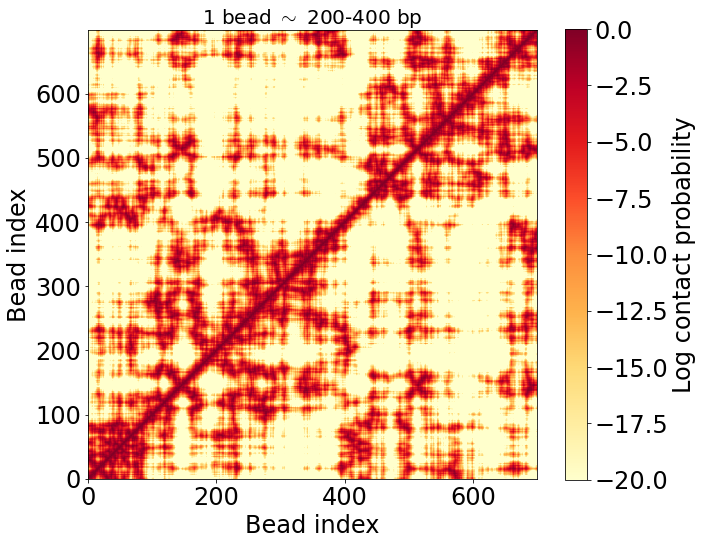

In [6]:
log_contact_map = aa.log_gauss_weighted_contact(sep_dist_mat[:,:,5500], sigma=.020)

fig, ax = aa.make_hic_plot(nbeads, log_contact_map, vmin=-20)
#fig.savefig(data_path/"analysis/hic_still.jpeg",dpi=1200) 


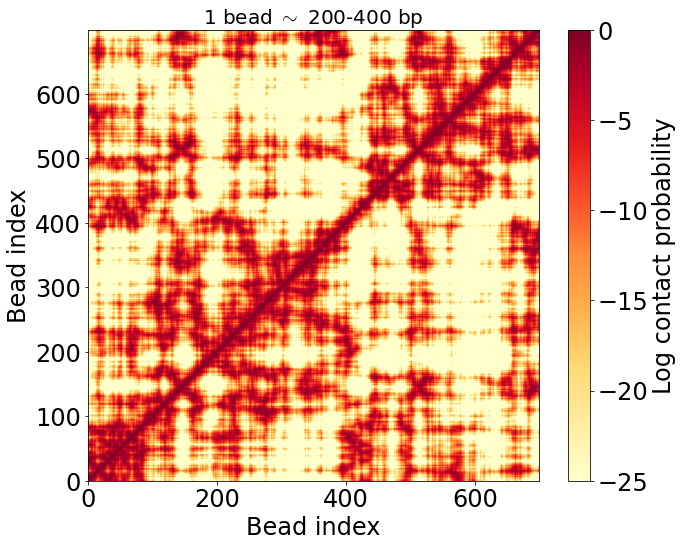

In [7]:
log_contact_map = aa.log_gauss_weighted_contact(sep_dist_mat[:,:,5500], sigma=.020)
#log_contact_map

#sep_dist_mat.shape
fig, ax = aa.make_hic_plot(nbeads, log_contact_map, vmin=-25)
#fig.savefig(data_path/"analysis/hic_still.jpeg",dpi=1200) 


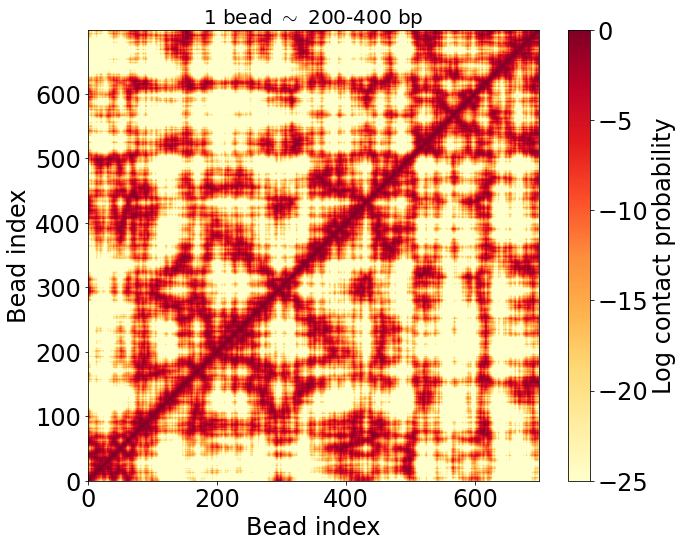

In [10]:
log_contact_map = aa.log_gauss_weighted_contact(sep_dist_mat[:,:,6000], sigma=.020)

fig, ax = aa.make_hic_plot(nbeads, log_contact_map, vmin=-25)
#fig.savefig(data_path/"analysis/hic_still.jpeg",dpi=1200) 

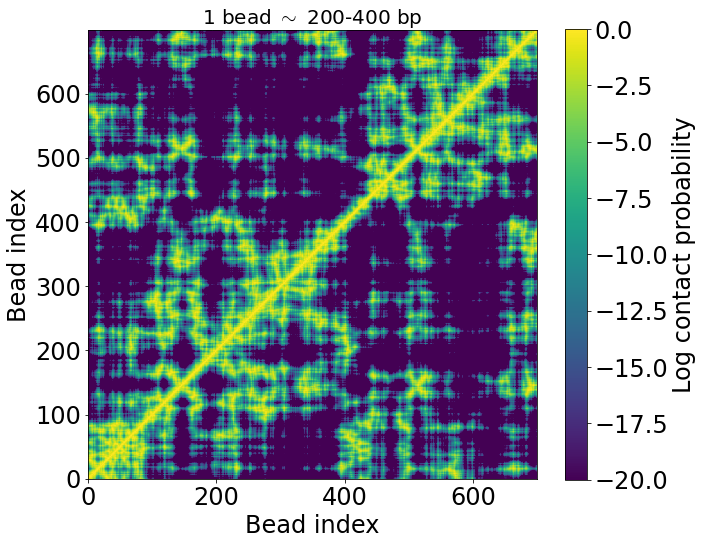

In [22]:
plt.rcParams['image.cmap'] = 'viridis'
log_contact_map = aa.log_gauss_weighted_contact(sep_dist_mat[:,:,5500], sigma=.020)

fig, ax = aa.make_hic_plot(nbeads, log_contact_map, vmin=-20)
fig.savefig(data_path/"analysis/hic_still_vir.jpeg",dpi=1200)
plt.rcParams['image.cmap'] = 'YlOrRd'

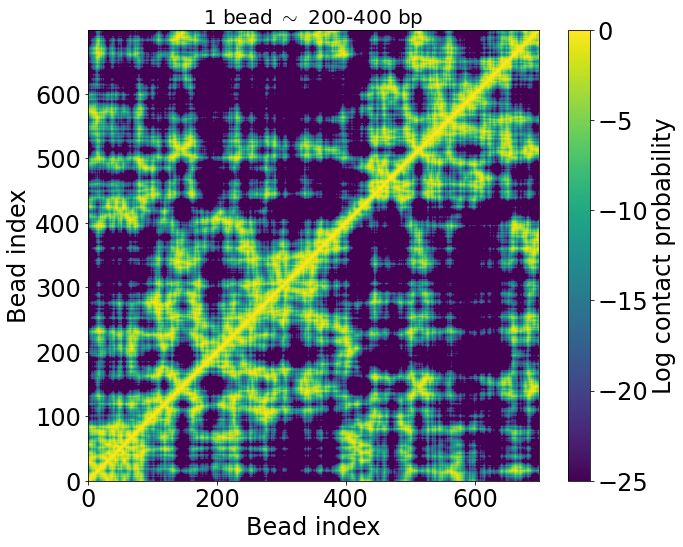

In [21]:
plt.rcParams['image.cmap'] = 'viridis'
log_contact_map = aa.log_gauss_weighted_contact(sep_dist_mat[:,:,5500], sigma=.020)

fig, ax = aa.make_hic_plot(nbeads, log_contact_map, vmin=-25)
fig.savefig(data_path/"analysis/hic_still_vir.jpeg",dpi=1200)
plt.rcParams['image.cmap'] = 'YlOrRd'

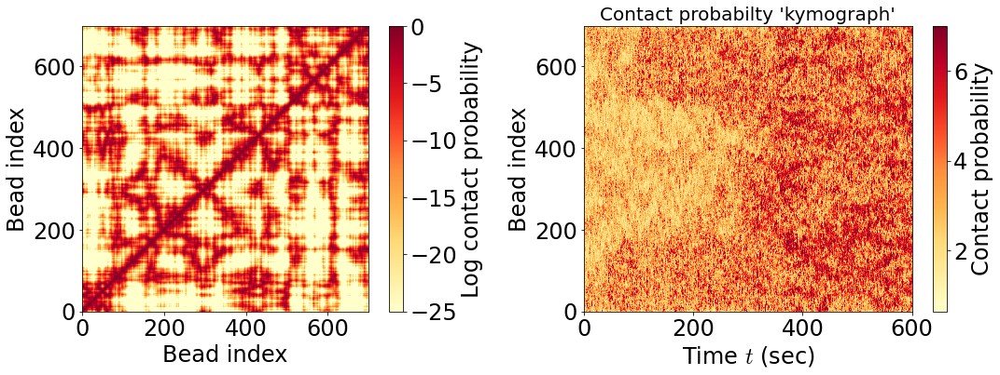

In [18]:
fig2, axarr2 = aa.make_summed_contact_kymo_graph(contact_mat[:,:,:end_ind], time_arr, vmin=-25, vmax=7)
fig2.savefig(data_path/"analysis/hic_kymo.jpeg", dpi=1200) 

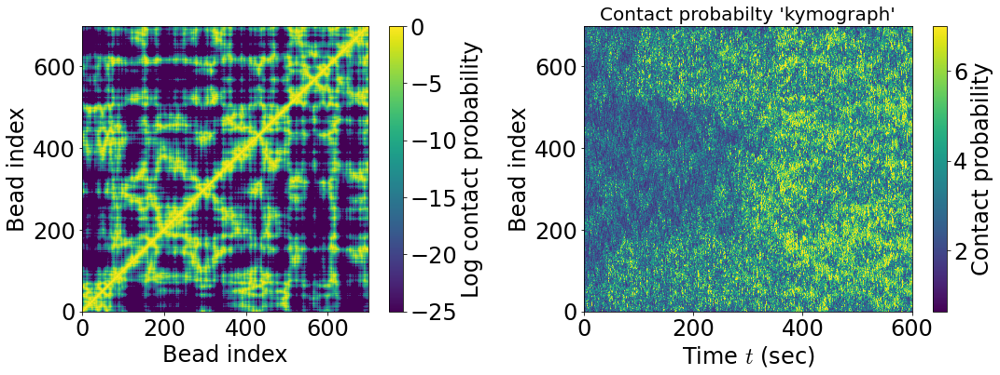

In [41]:
plt.rcParams['image.cmap'] = 'viridis'
fig2, axarr2 = aa.make_summed_contact_kymo_graph(contact_mat[:,:,:end_ind], time_arr, vmin=-25, vmax=7)
fig2.savefig(data_path/"analysis/hic_kymo_viridis.jpeg", dpi=1200) 
plt.rcParams['image.cmap'] = 'YlOrRd'

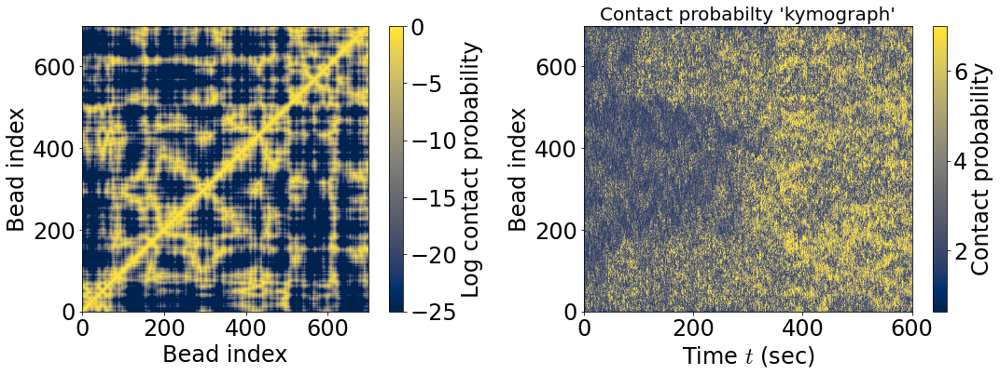

In [42]:
plt.rcParams['image.cmap'] = 'cividis'
fig2, axarr2 = aa.make_summed_contact_kymo_graph(contact_mat[:,:,:end_ind], time_arr, vmin=-25, vmax=7)
fig2.savefig(data_path/"analysis/hic_kymo_cividis.jpeg", dpi=1200) 
plt.rcParams['image.cmap'] = 'YlOrRd'

Text(0.5, 1.0, 't = 0.0 sec')

Text(0.5, 1.0, 't = 50.0 sec')

Text(0.5, 1.0, 't = 100.0 sec')

Text(0.5, 1.0, 't = 150.0 sec')

Text(0.5, 1.0, 't = 200.0 sec')

Text(0.5, 1.0, 't = 250.0 sec')

Text(0.5, 1.0, 't = 300.0 sec')

Text(0.5, 1.0, 't = 350.0 sec')

Text(0.5, 1.0, 't = 400.0 sec')

Text(0.5, 1.0, 't = 450.0 sec')

Text(0.5, 1.0, 't = 500.0 sec')

Text(0.5, 1.0, 't = 550.0 sec')

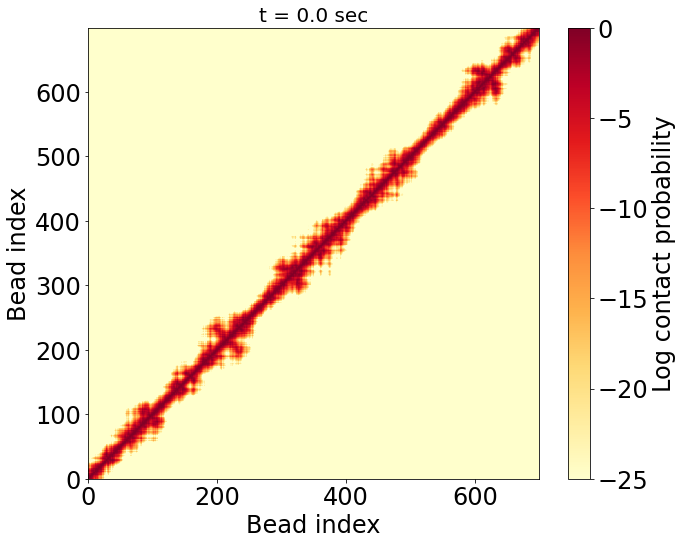

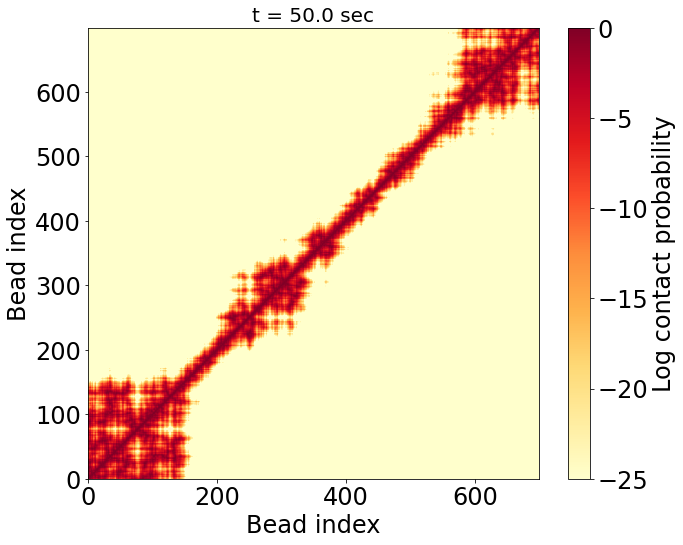

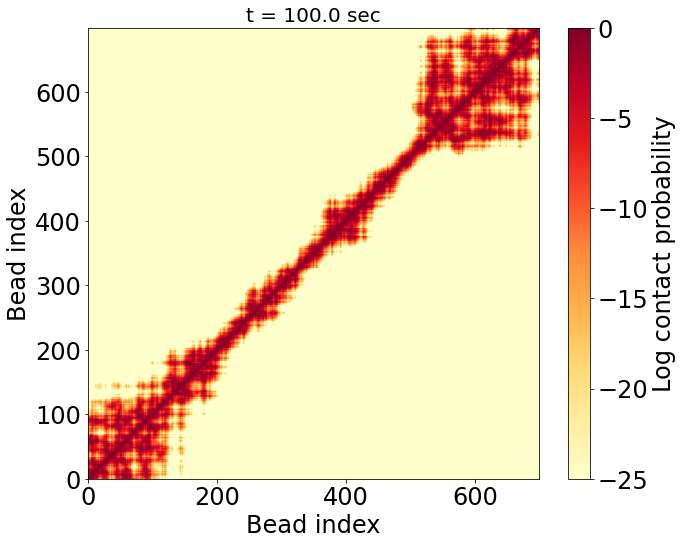

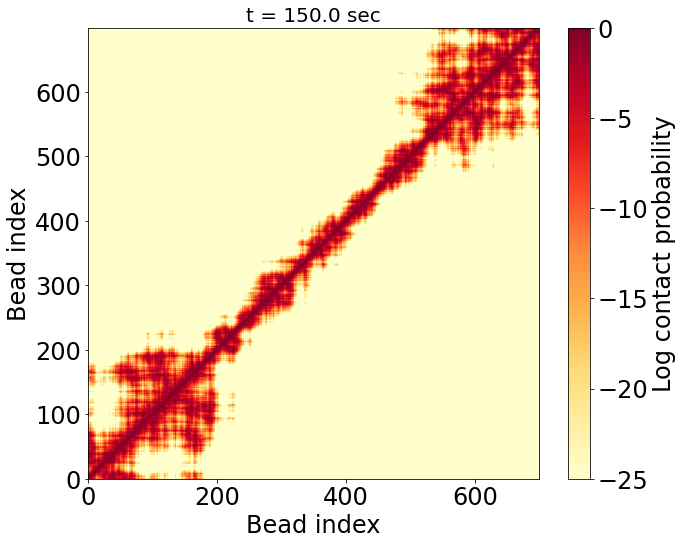

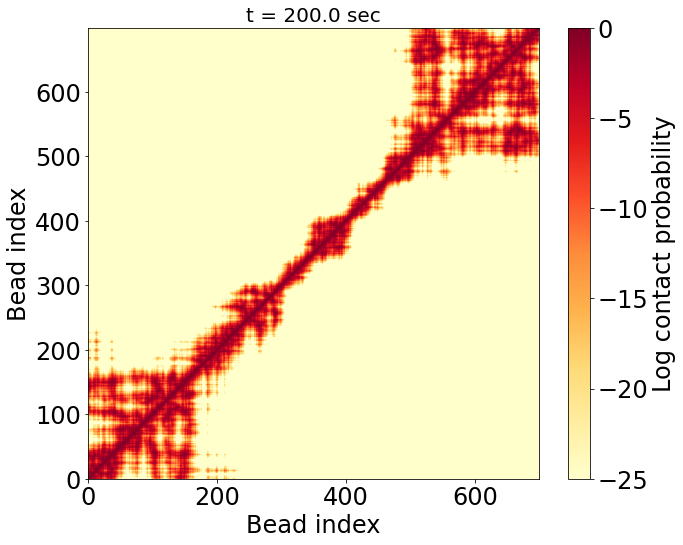

...

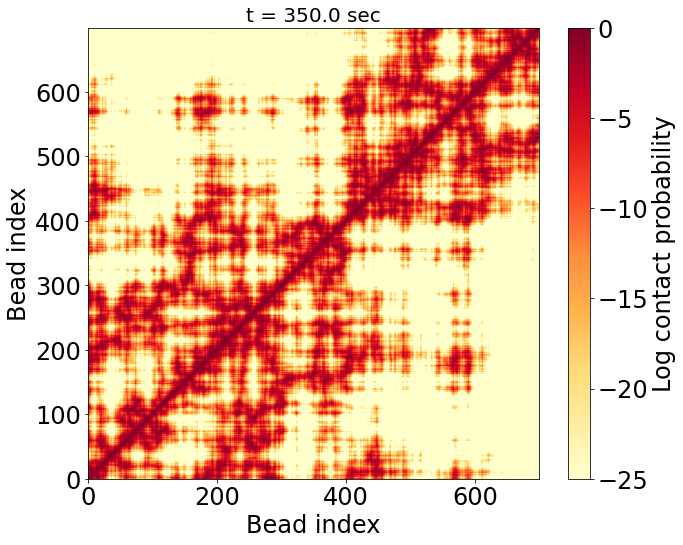

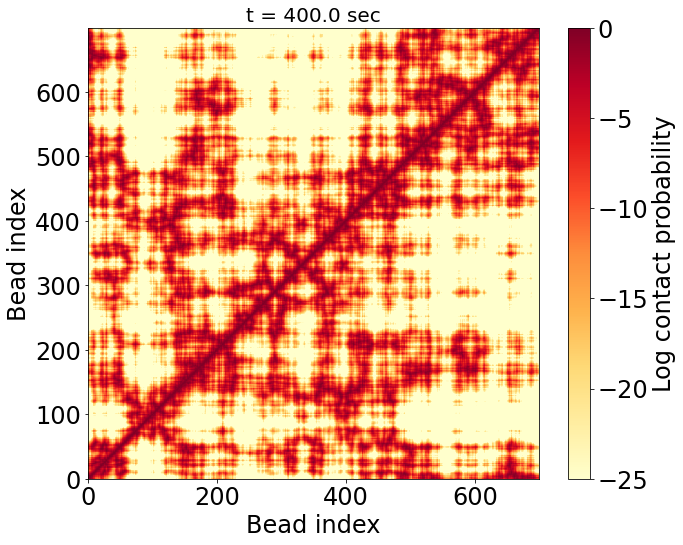

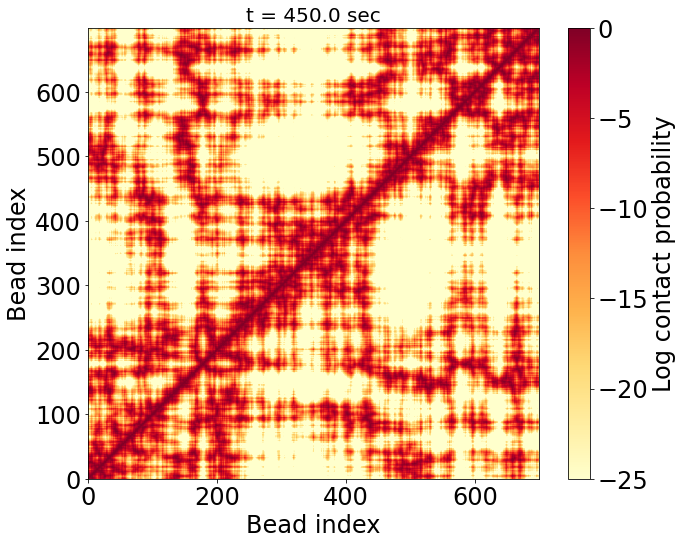

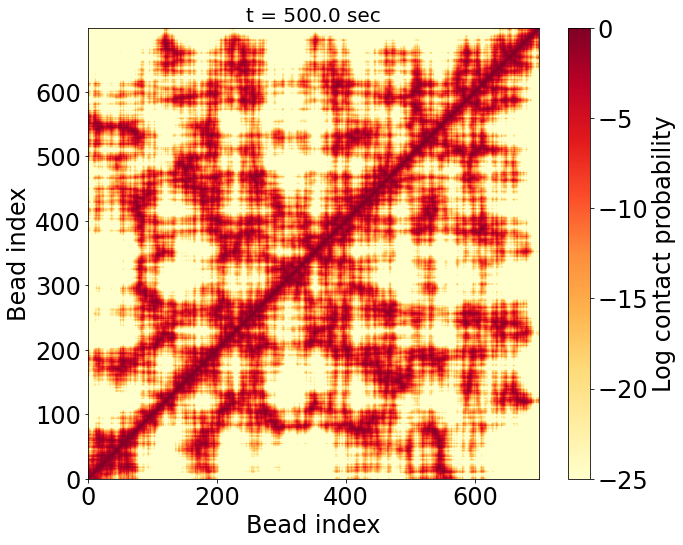

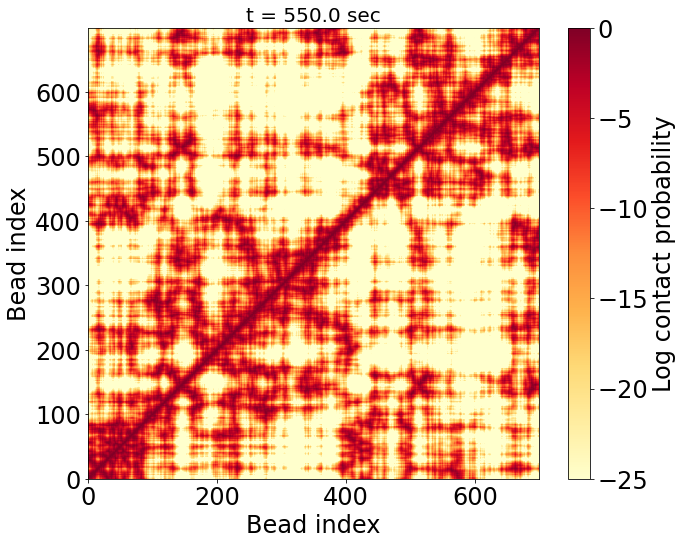

In [43]:
for i in range(0,6000,500):
    log_contact_map = aa.log_gauss_weighted_contact(sep_dist_mat[:,:,i], sigma=.020)
    fig, ax = aa.make_hic_plot(nbeads, log_contact_map, vmin=-25)
    ax.set_title(f't = {time_arr[i+1]} sec')
    fig.savefig(data_path/f"analysis/hic_still_{i}.jpeg",dpi=1200) 


# Original condensate kymographs

In [27]:
data_path = (ceph_path /"21-10-18_aLchr1_line700_2xsticky_conf")
ss_ind = 0
end_ind = -1
start_bead = 0
end_bead = -1
with h5py.File(next(data_path.glob('analysis/*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:end_ind]
    print(time_arr.size)
    sy_dat = h5_data['raw_data']['sylinders'][start_bead:end_bead,:,ss_ind:end_ind]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]
    sep_dist_mat = aa.get_sep_dist_mat(h5_data, ss_ind, bead_range=[start_bead,end_bead])
    contact_mat = aa.gauss_weighted_contact(sep_dist_mat)


6001


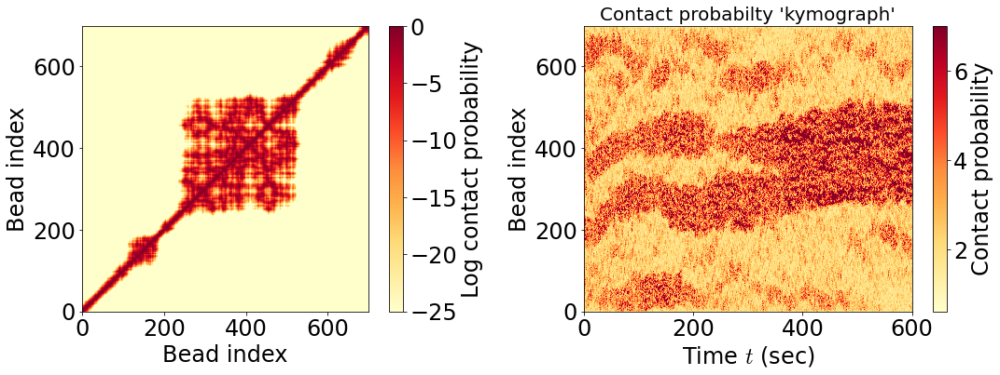

In [31]:
fig2, axarr2 = aa.make_summed_contact_kymo_graph(contact_mat[:,:,:end_ind], time_arr, vmin=-25, vmax=7)
fig2.savefig(data_path/"analysis/hic_kymo.jpeg", dpi=1200) 

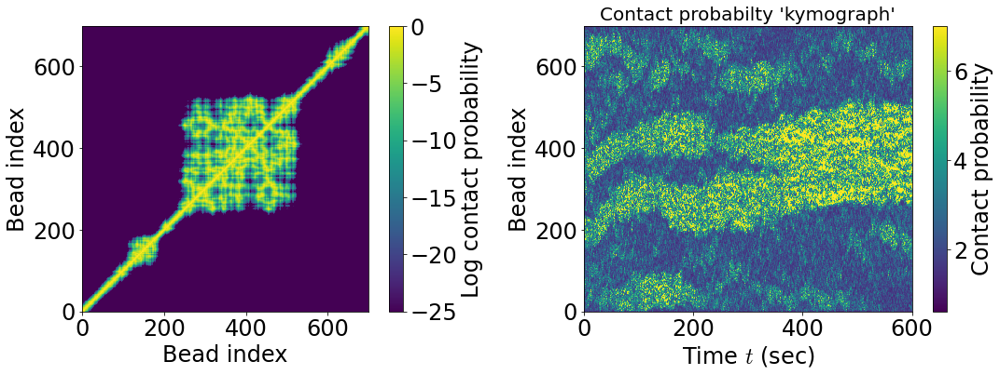

In [29]:
plt.rcParams['image.cmap'] = 'viridis'
fig2, axarr2 = aa.make_summed_contact_kymo_graph(contact_mat[:,:,:end_ind], time_arr, vmin=-25, vmax=7)
fig2.savefig(data_path/"analysis/hic_kymo_viridis.jpeg", dpi=1200) 
plt.rcParams['image.cmap'] = 'YlOrRd'

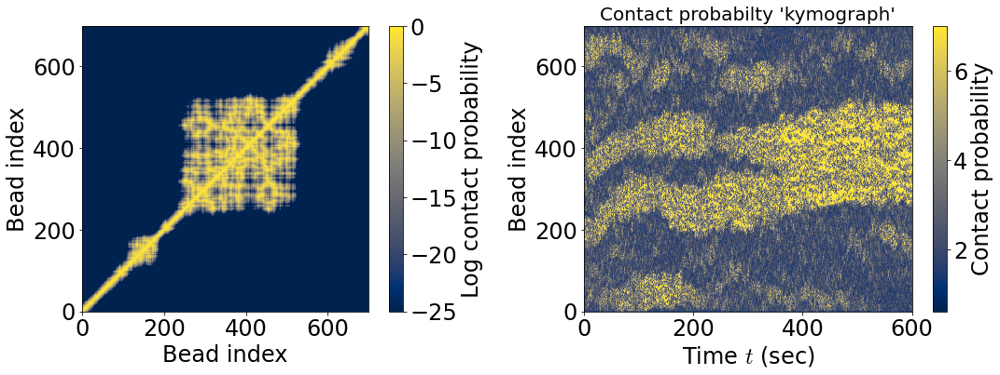

In [33]:
plt.rcParams['image.cmap'] = 'cividis'
fig2, axarr2 = aa.make_summed_contact_kymo_graph(contact_mat[:,:,:end_ind], time_arr, vmin=-25, vmax=7)
fig2.savefig(data_path/"analysis/hic_kymo_cividis.jpeg", dpi=1200) 
plt.rcParams['image.cmap'] = 'YlOrRd'

Text(0.5, 1.0, 't = 0.0 sec')

Text(0.5, 1.0, 't = 50.0 sec')

Text(0.5, 1.0, 't = 100.0 sec')

Text(0.5, 1.0, 't = 150.0 sec')

Text(0.5, 1.0, 't = 200.0 sec')

Text(0.5, 1.0, 't = 250.0 sec')

Text(0.5, 1.0, 't = 300.0 sec')

Text(0.5, 1.0, 't = 350.0 sec')

Text(0.5, 1.0, 't = 400.0 sec')

Text(0.5, 1.0, 't = 450.0 sec')

Text(0.5, 1.0, 't = 500.0 sec')

Text(0.5, 1.0, 't = 550.0 sec')

IndexError: index 6001 is out of bounds for axis 0 with size 6001

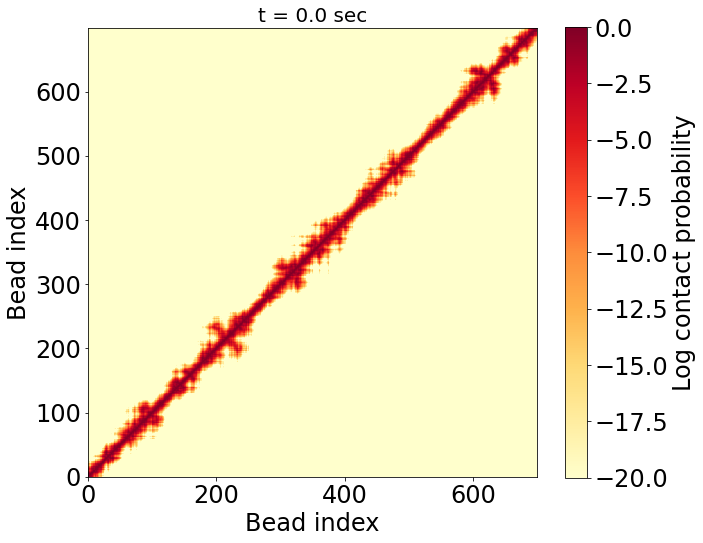

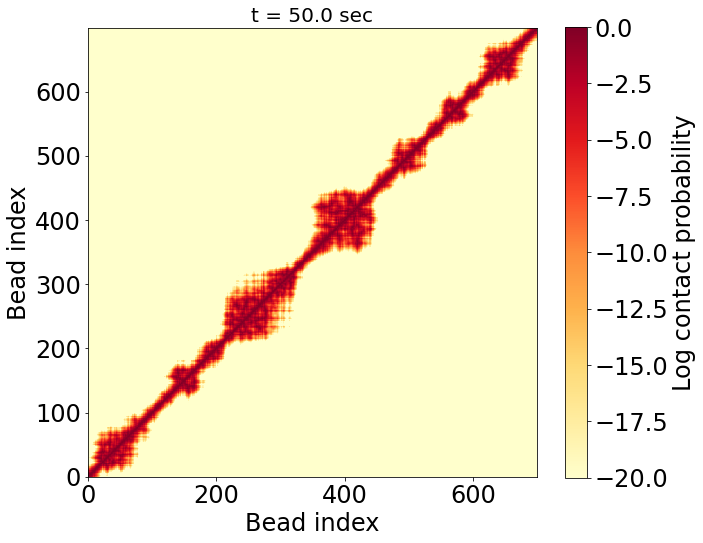

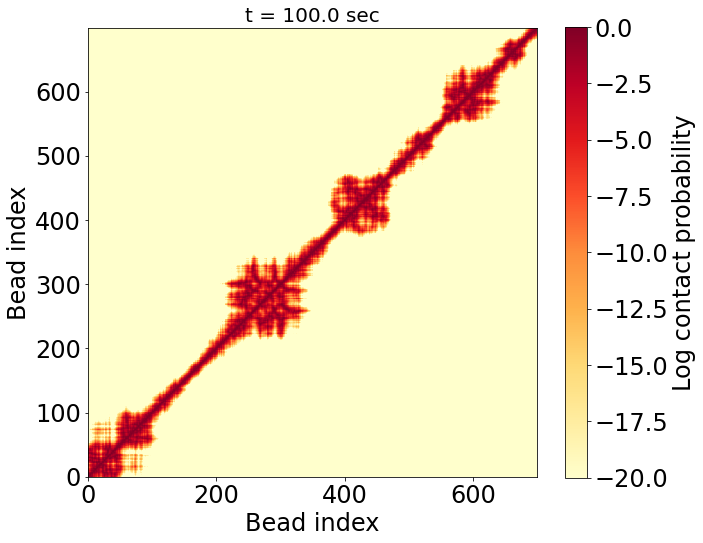

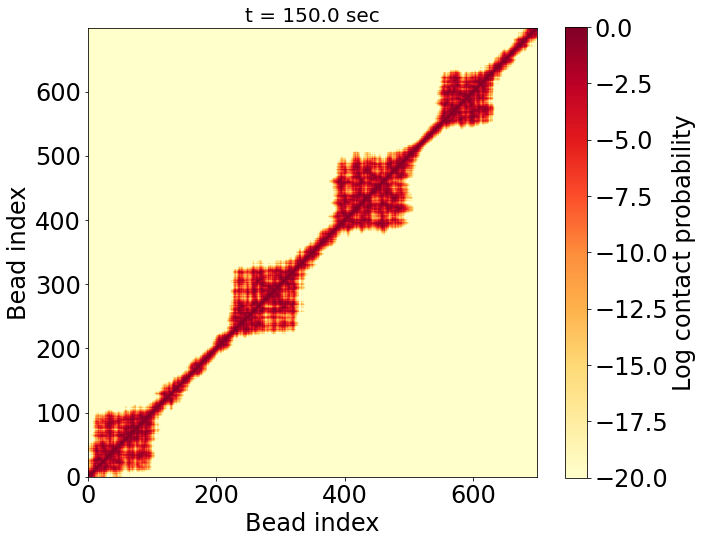

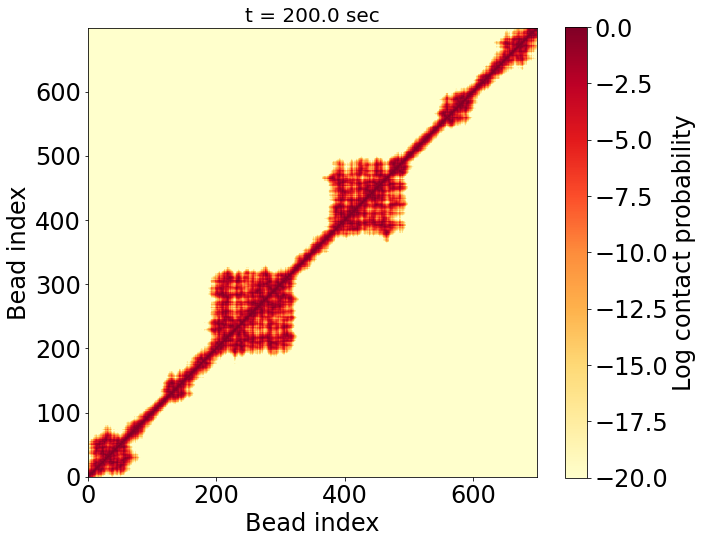

...

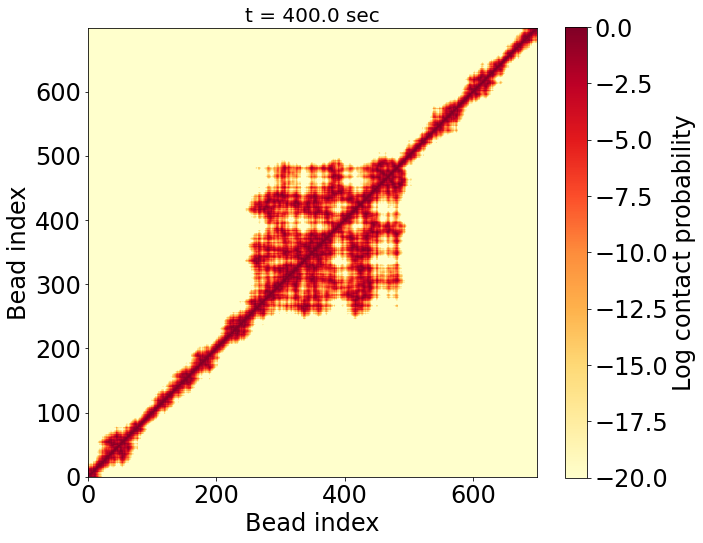

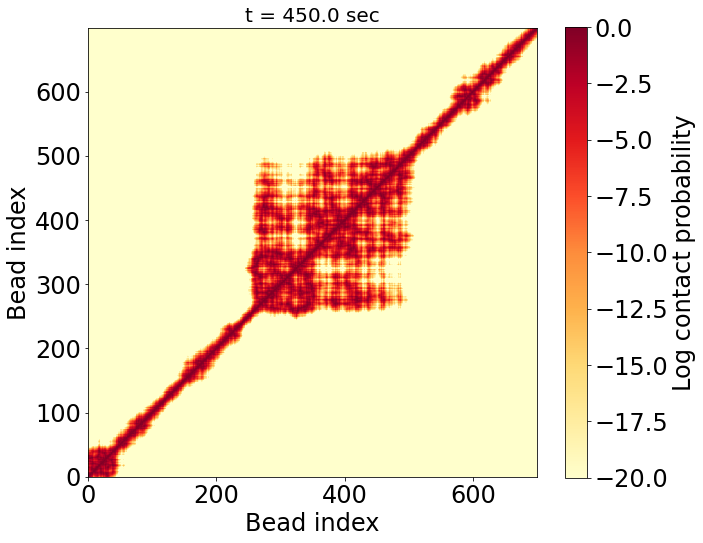

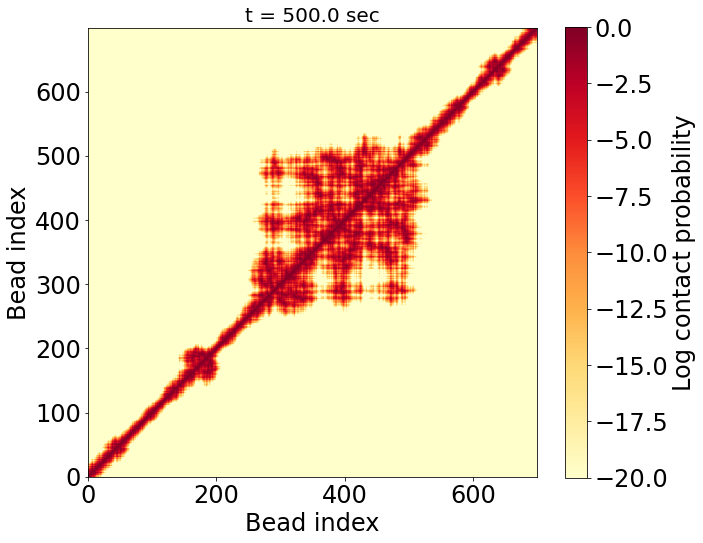

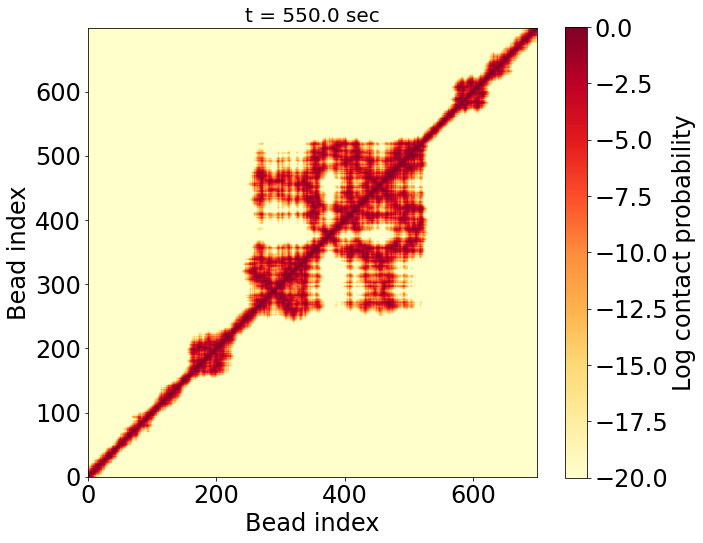

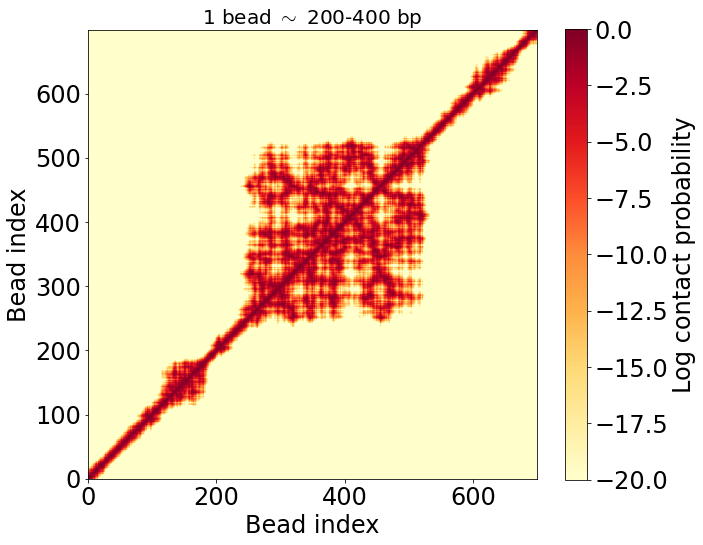

In [38]:
for i in range(0,6000,500):
    log_contact_map = aa.log_gauss_weighted_contact(sep_dist_mat[:,:,i], sigma=.020)
    fig, ax = aa.make_hic_plot(nbeads, log_contact_map, vmin=-20)
    ax.set_title(f't = {time_arr[i+1]} sec')
    fig.savefig(data_path/f"analysis/hic_still_{i}.jpeg",dpi=1200) 


# Merge condensate kymographs (3um, seed 5)

In [44]:
data_path = (ceph_path /"21-12-05_aLchr1_scan.12_line700_2xsticky_3umconf/simulations/s5")
ss_ind = 0
end_ind = -1
start_bead = 0
end_bead = -1
with h5py.File(next(data_path.glob('analysis/*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:end_ind]
    print(time_arr.size)
    sy_dat = h5_data['raw_data']['sylinders'][start_bead:end_bead,:,ss_ind:end_ind]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]
    sep_dist_mat = aa.get_sep_dist_mat(h5_data, ss_ind, bead_range=[start_bead,end_bead])
    contact_mat = aa.gauss_weighted_contact(sep_dist_mat)


6001


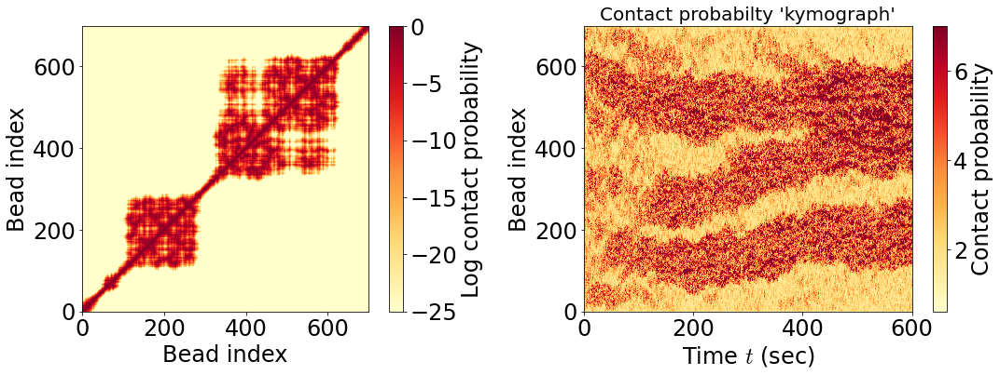

In [45]:
fig2, axarr2 = aa.make_summed_contact_kymo_graph(contact_mat[:,:,:end_ind], time_arr, vmin=-25, vmax=7)
fig2.savefig(data_path/"analysis/hic_kymo.jpeg", dpi=1200) 

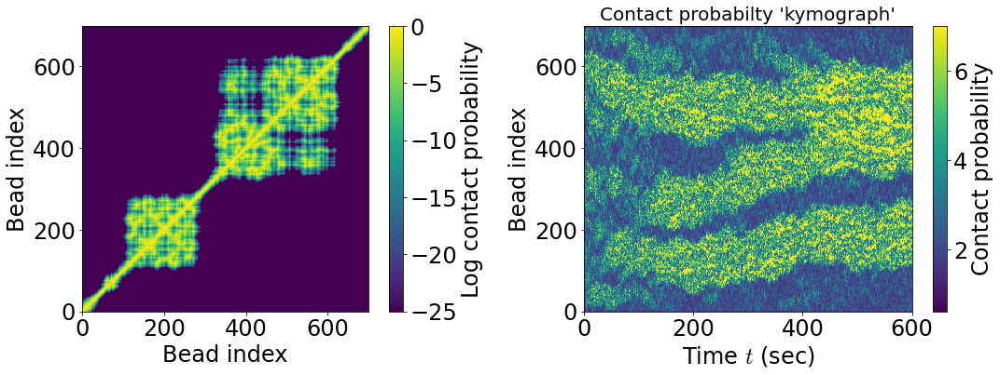

In [46]:
plt.rcParams['image.cmap'] = 'viridis'
fig2, axarr2 = aa.make_summed_contact_kymo_graph(contact_mat[:,:,:end_ind], time_arr, vmin=-25, vmax=7)
fig2.savefig(data_path/"analysis/hic_kymo_viridis.jpeg", dpi=1200) 
plt.rcParams['image.cmap'] = 'YlOrRd'

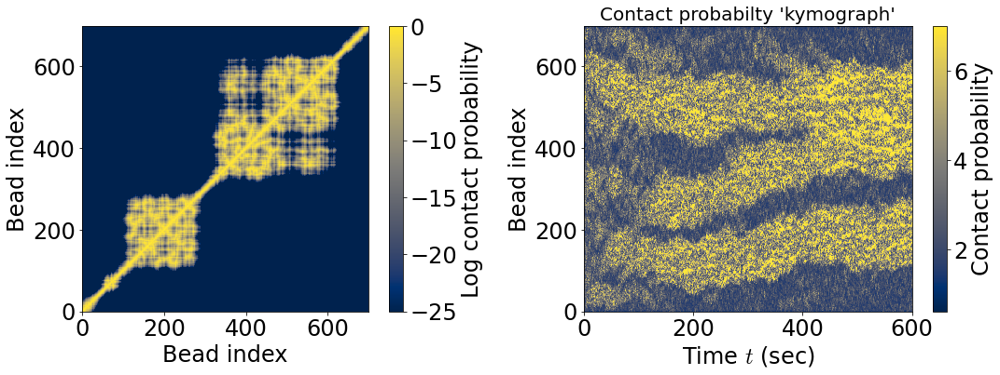

In [47]:
plt.rcParams['image.cmap'] = 'cividis'
fig2, axarr2 = aa.make_summed_contact_kymo_graph(contact_mat[:,:,:end_ind], time_arr, vmin=-25, vmax=7)
fig2.savefig(data_path/"analysis/hic_kymo_cividis.jpeg", dpi=1200) 
plt.rcParams['image.cmap'] = 'YlOrRd'

Text(0.5, 1.0, 't = 0.0 sec')

Text(0.5, 1.0, 't = 50.0 sec')

Text(0.5, 1.0, 't = 100.0 sec')

Text(0.5, 1.0, 't = 150.0 sec')

Text(0.5, 1.0, 't = 200.0 sec')

Text(0.5, 1.0, 't = 250.0 sec')

Text(0.5, 1.0, 't = 300.0 sec')

Text(0.5, 1.0, 't = 350.0 sec')

Text(0.5, 1.0, 't = 400.0 sec')

Text(0.5, 1.0, 't = 450.0 sec')

Text(0.5, 1.0, 't = 500.0 sec')

Text(0.5, 1.0, 't = 550.0 sec')

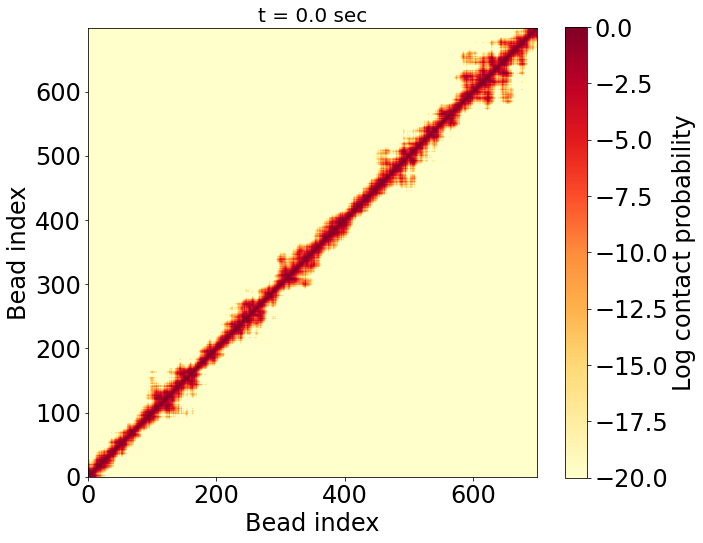

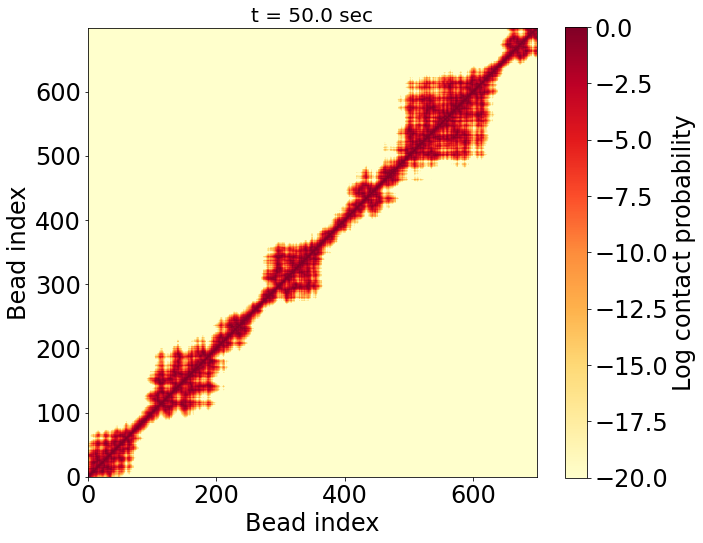

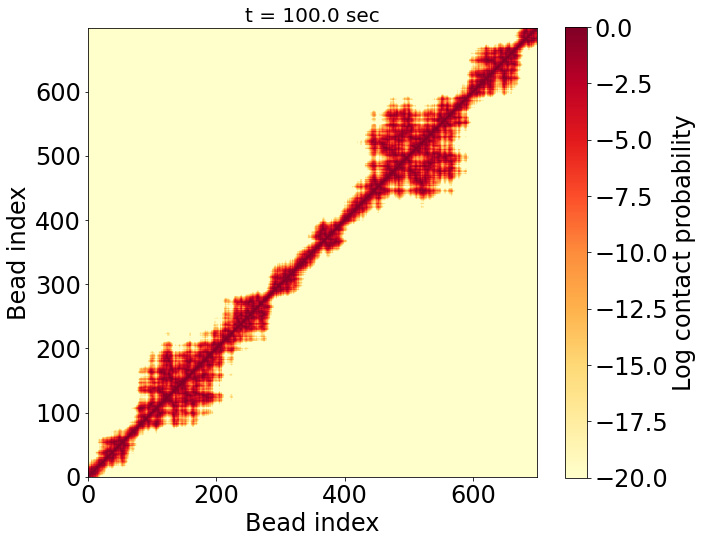

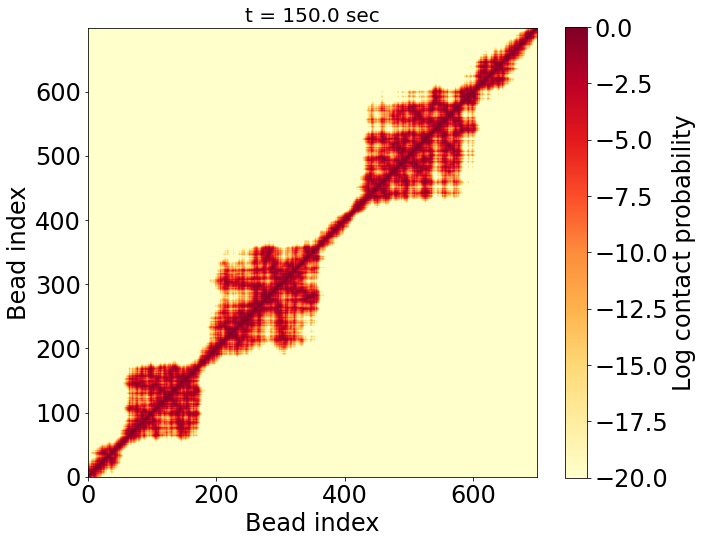

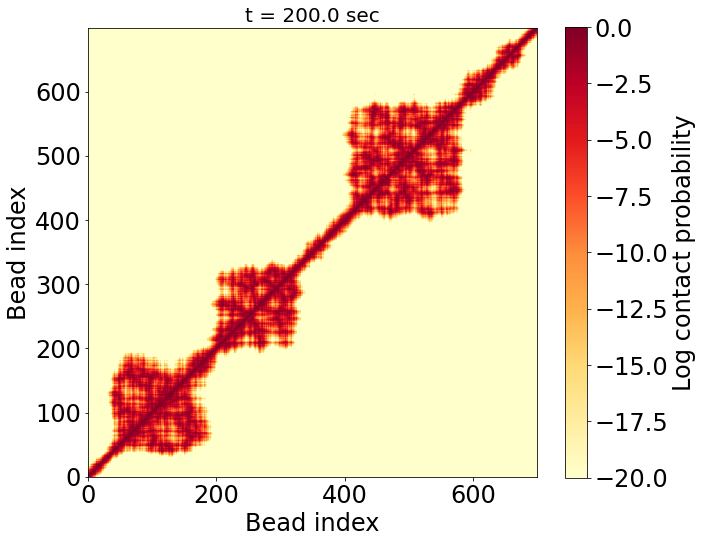

...

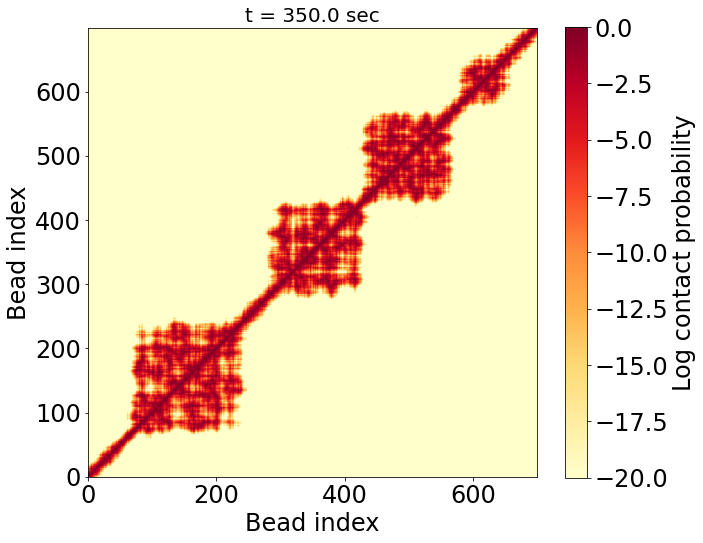

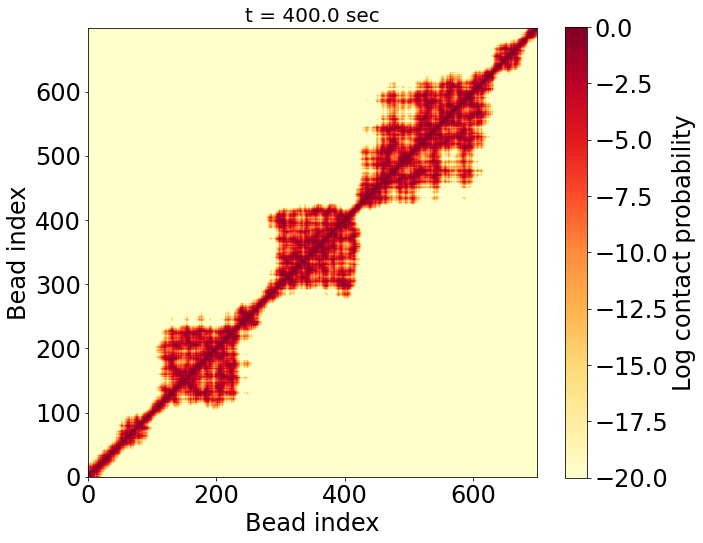

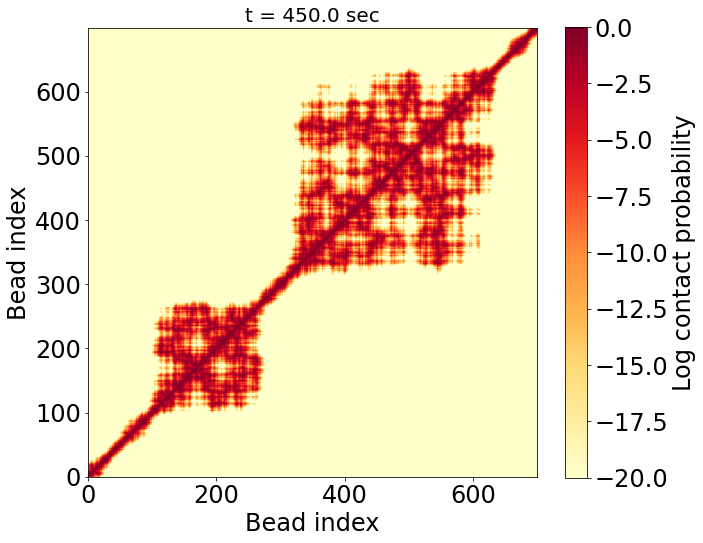

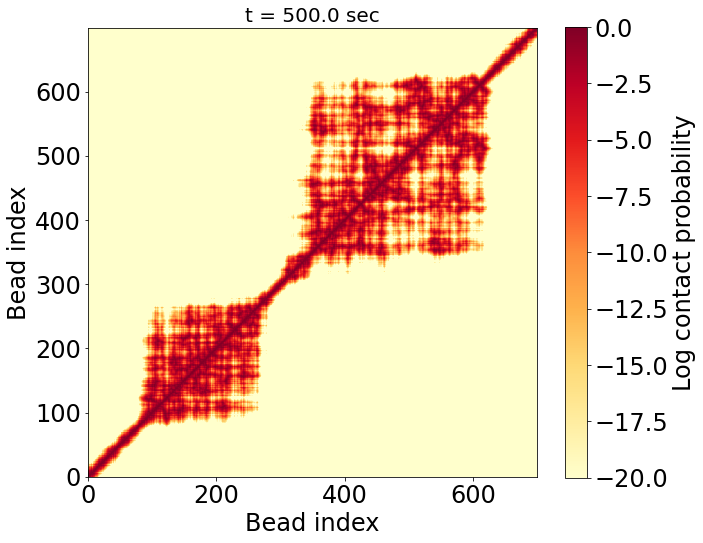

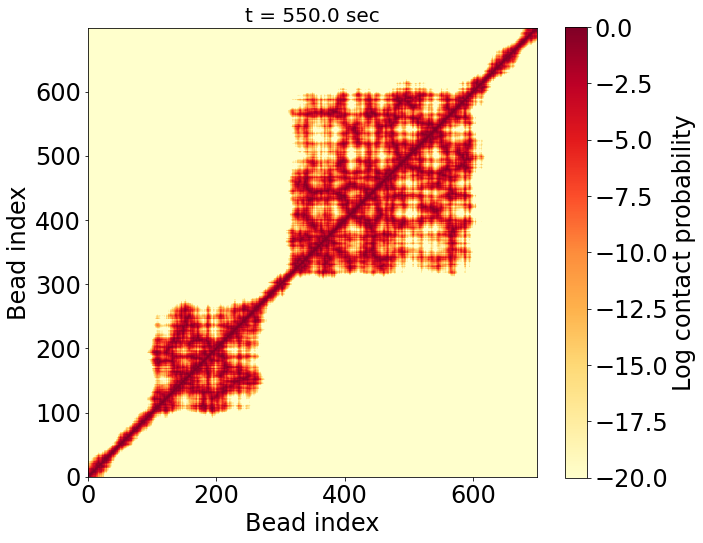

In [48]:
for i in range(0,6000,500):
    log_contact_map = aa.log_gauss_weighted_contact(sep_dist_mat[:,:,i], sigma=.020)
    fig, ax = aa.make_hic_plot(nbeads, log_contact_map, vmin=-20)
    ax.set_title(f't = {time_arr[i+1]} sec')
    fig.savefig(data_path/f"analysis/hic_still_{i}.jpeg",dpi=1200) 


# Competing condensate kymographs (3um, seed 2)

In [49]:
data_path = (ceph_path /"21-12-05_aLchr1_scan.12_line700_2xsticky_3umconf/simulations/s2")
ss_ind = 0
end_ind = -1
start_bead = 0
end_bead = -1
with h5py.File(next(data_path.glob('analysis/*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:end_ind]
    print(time_arr.size)
    sy_dat = h5_data['raw_data']['sylinders'][start_bead:end_bead,:,ss_ind:end_ind]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]
    sep_dist_mat = aa.get_sep_dist_mat(h5_data, ss_ind, bead_range=[start_bead,end_bead])
    contact_mat = aa.gauss_weighted_contact(sep_dist_mat)


6001


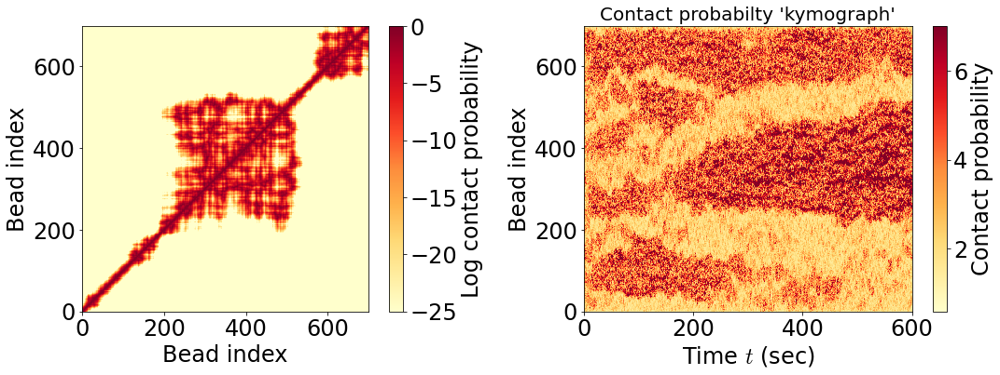

In [50]:
fig2, axarr2 = aa.make_summed_contact_kymo_graph(contact_mat[:,:,:end_ind], time_arr, vmin=-25, vmax=7)
fig2.savefig(data_path/"analysis/hic_kymo.jpeg", dpi=1200) 

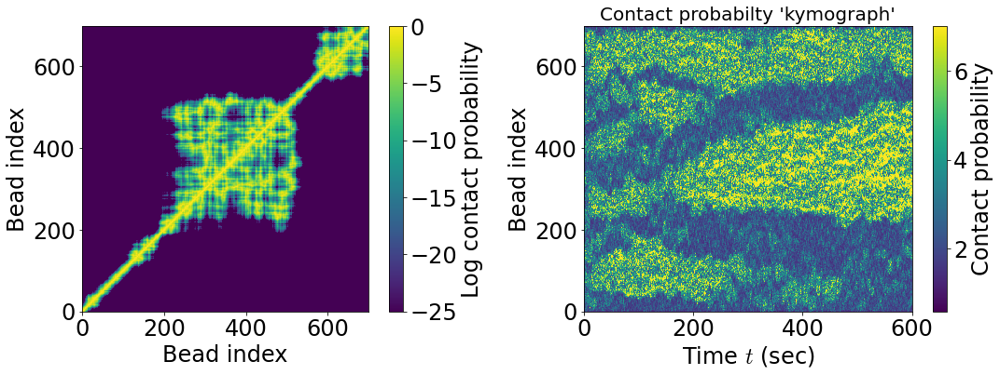

In [51]:
plt.rcParams['image.cmap'] = 'viridis'
fig2, axarr2 = aa.make_summed_contact_kymo_graph(contact_mat[:,:,:end_ind], time_arr, vmin=-25, vmax=7)
fig2.savefig(data_path/"analysis/hic_kymo_viridis.jpeg", dpi=1200) 
plt.rcParams['image.cmap'] = 'YlOrRd'

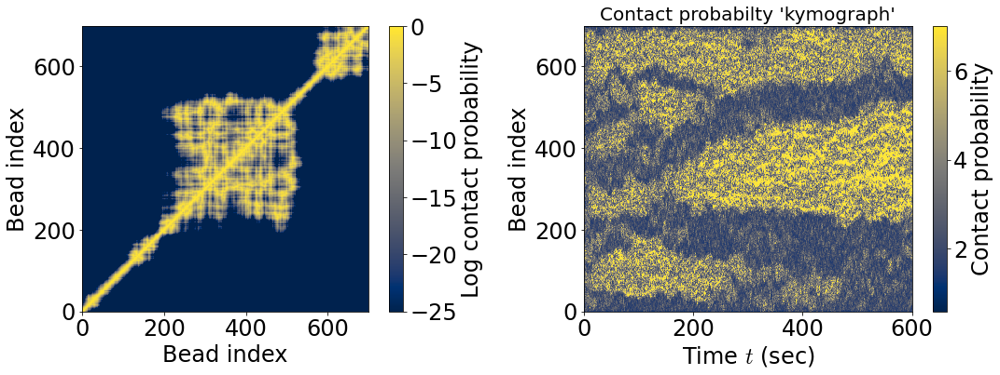

In [52]:
plt.rcParams['image.cmap'] = 'cividis'
fig2, axarr2 = aa.make_summed_contact_kymo_graph(contact_mat[:,:,:end_ind], time_arr, vmin=-25, vmax=7)
fig2.savefig(data_path/"analysis/hic_kymo_cividis.jpeg", dpi=1200) 
plt.rcParams['image.cmap'] = 'YlOrRd'

Text(0.5, 1.0, 't = 0.0 sec')

Text(0.5, 1.0, 't = 50.0 sec')

Text(0.5, 1.0, 't = 100.0 sec')

Text(0.5, 1.0, 't = 150.0 sec')

Text(0.5, 1.0, 't = 200.0 sec')

Text(0.5, 1.0, 't = 250.0 sec')

Text(0.5, 1.0, 't = 300.0 sec')

Text(0.5, 1.0, 't = 350.0 sec')

Text(0.5, 1.0, 't = 400.0 sec')

Text(0.5, 1.0, 't = 450.0 sec')

Text(0.5, 1.0, 't = 500.0 sec')

Text(0.5, 1.0, 't = 550.0 sec')

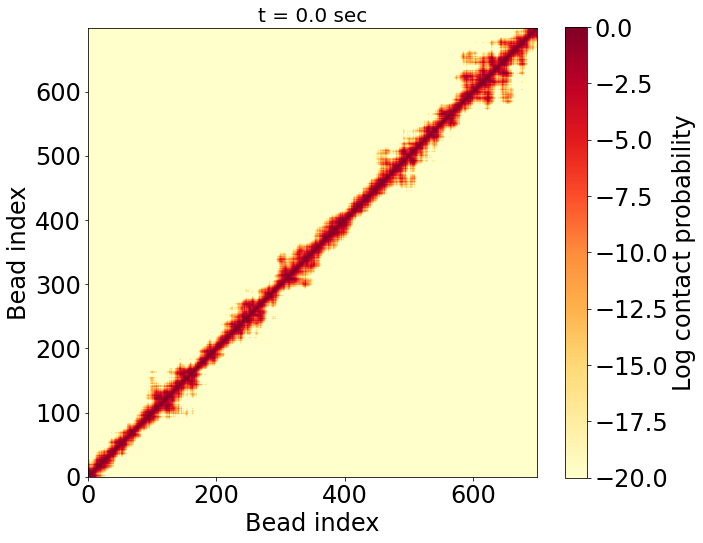

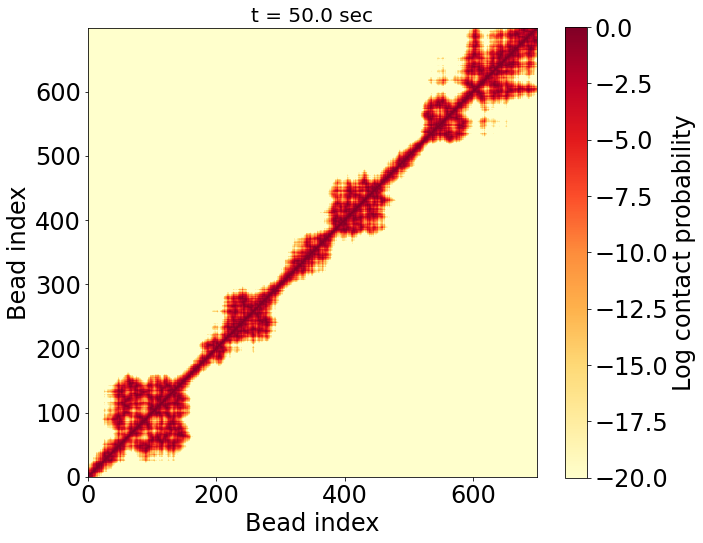

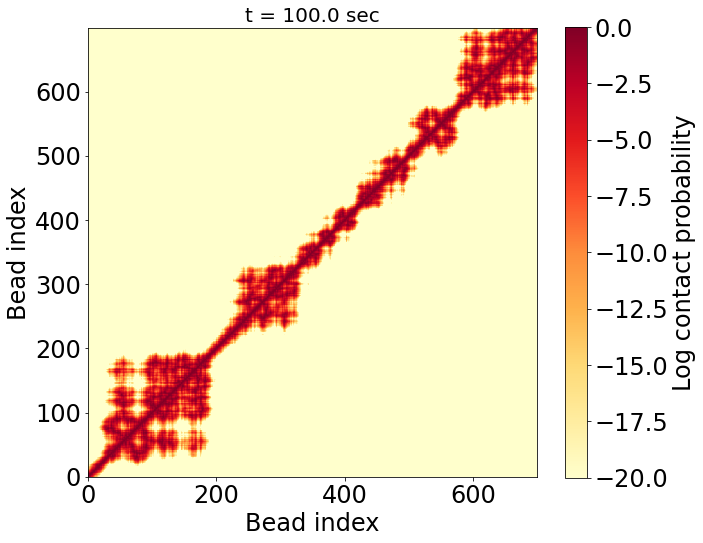

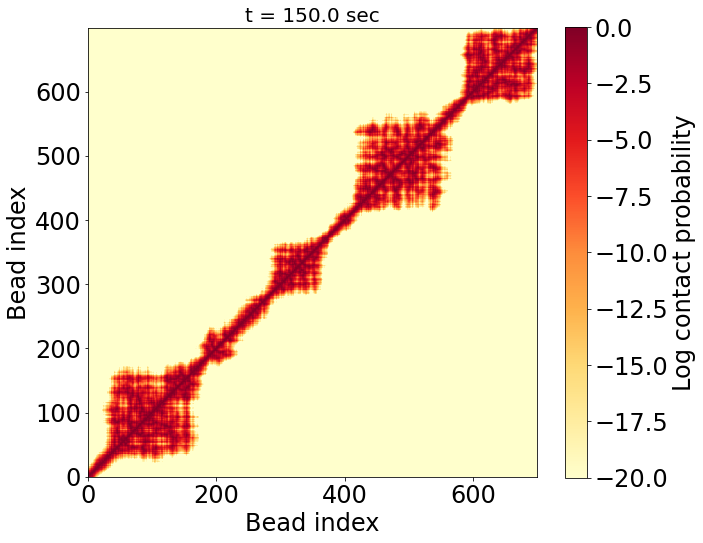

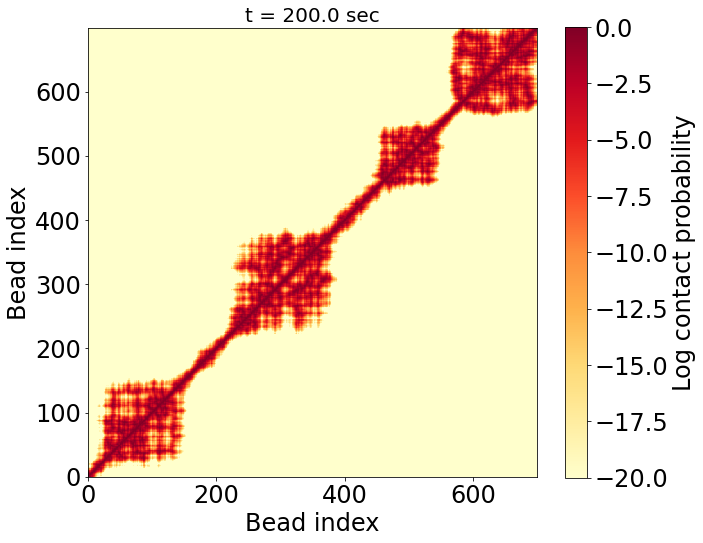

...

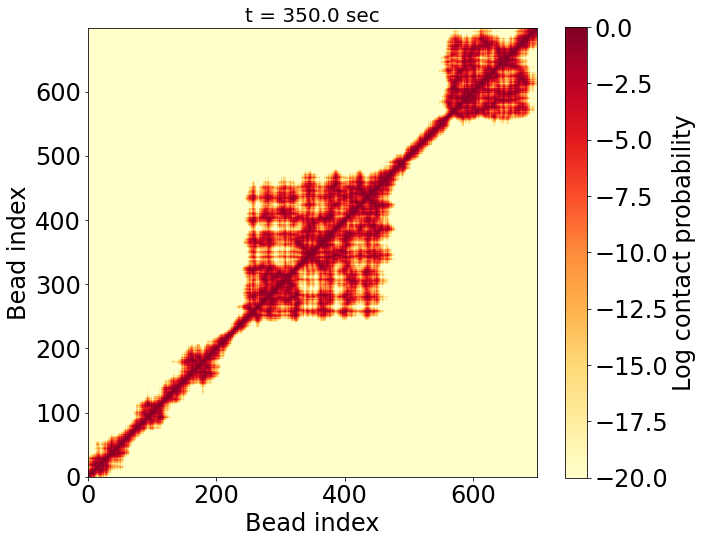

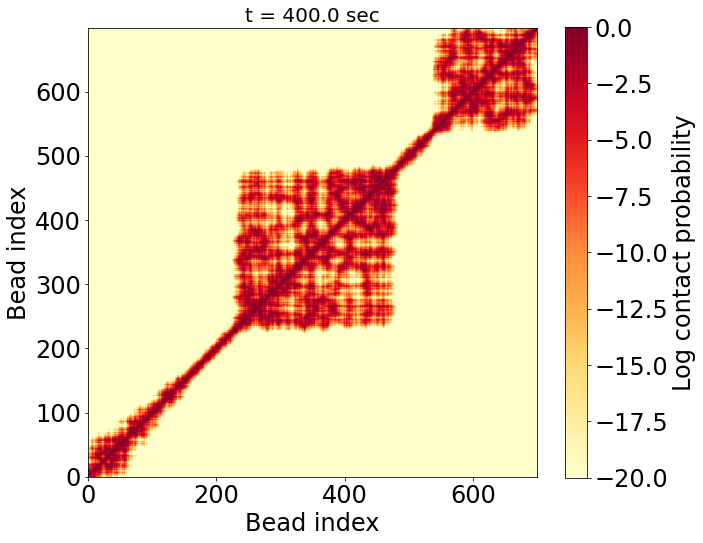

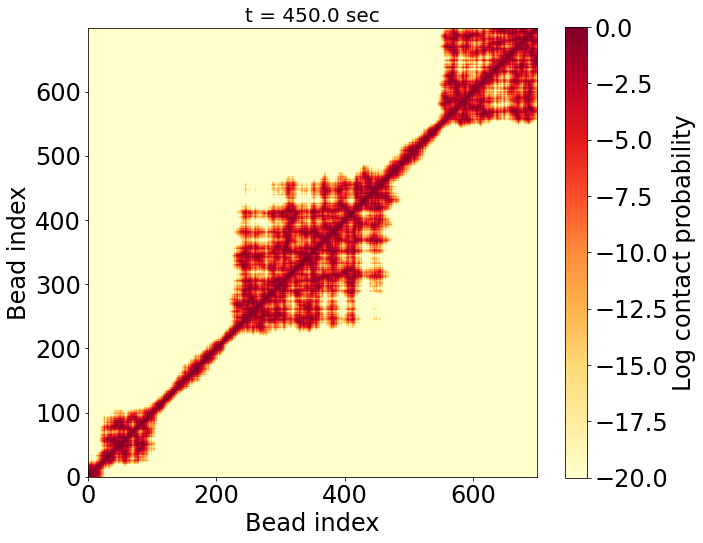

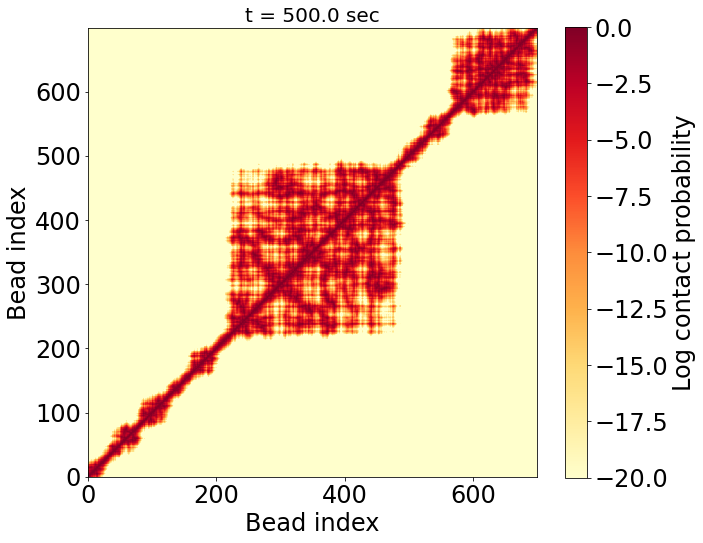

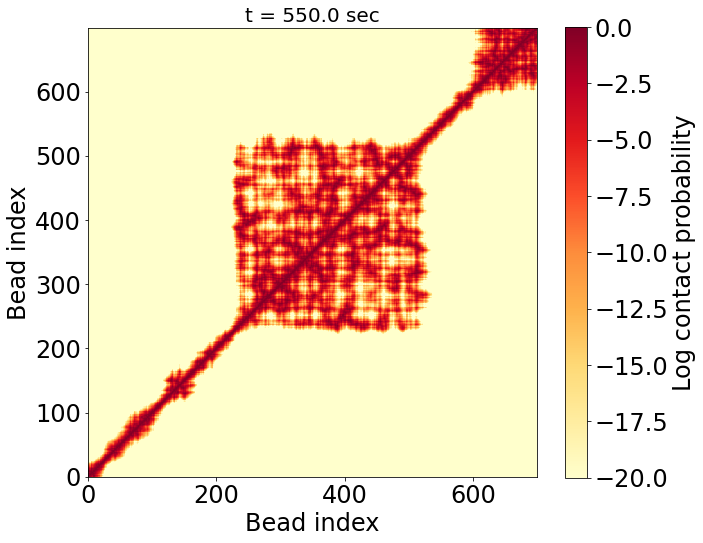

In [53]:
for i in range(0,6000,500):
    log_contact_map = aa.log_gauss_weighted_contact(sep_dist_mat[:,:,i], sigma=.020)
    fig, ax = aa.make_hic_plot(nbeads, log_contact_map, vmin=-20)
    ax.set_title(f't = {time_arr[i+1]} sec')
    fig.savefig(data_path/f"analysis/hic_still_{i}.jpeg",dpi=1200) 
